In [1]:
###                                DATA ANALYSIS OF IPL AUCTION DATA OF 12 YEARS (2013 TO 2024)            ######                          

In [2]:
##                                                  NAME                  

In [3]:
###                                          GOURAB BANERJEE          

In [4]:
############## WEB SCRAPING OF IPL AUCTION DATA FROM 2013 TO 2024  ############

In [5]:
####This code imports two essential Python libraries. numpy (imported as np) is used for numerical operations and handling arrays.
###pandas (imported as pd) is a data manipulation library for working with data structures like DataFrames, which are crucial for data analysis, 
###cleaning, and transformation tasks
import numpy as np # linear algebra
import pandas as pd

In [6]:
# Import libraries for web scrapping
from bs4 import BeautifulSoup
import requests

In [7]:
### The code fetches the HTML content of an IPL auction page, then parses it using BeautifulSoup to make the data easily accessible.
url = "https://www.iplt20.com/auction"
response = requests.get(url)
data = response.text
soup = BeautifulSoup(data,'html.parser')

In [8]:
# Find all the urls
auction_years_lis = soup.find('ul', {'class':'year-auction nav'}).find_all('li')
urls = [ ]
for li in auction_years_lis:
    urls.append(li.find('a').get('href'))
print(urls)
print(len(urls))

['https://www.iplt20.com/auction/2024', 'https://www.iplt20.com/auction/2023', 'https://www.iplt20.com/auction/2022', 'https://www.iplt20.com/auction/2021', 'https://www.iplt20.com/auction/2020', 'https://www.iplt20.com/auction/2019', 'https://www.iplt20.com/auction/2018', 'https://www.iplt20.com/auction/2017', 'https://www.iplt20.com/auction/2016', 'https://www.iplt20.com/auction/2015', 'https://www.iplt20.com/auction/2014', 'https://www.iplt20.com/auction/2013']
12


In [9]:
###The code scrapes IPL player details from URLs, extracting and printing team and player information, storing it in a dictionary.
players = {} # Dict to store each record
no_of_players = 0
for url in urls:
    season = url.split('/')[-1]
    print('Season: ', season)
    response = requests.get(url)
    data = response.text
    season_soup = BeautifulSoup(data,'html.parser')
    ipl_teams = season_soup.find_all('section', {'class':'ih-points-table-sec'})
    for team in ipl_teams:
        #no_of_teams = no_of_teams + 1
        team_name = team.find('h2').text
        print(team_name)
        print("Details: ")
        team_details = team.find('table')
        team_tr = team_details.find_all('tr')
        for tr in team_tr[1:]:
            no_of_players = no_of_players + 1
            print("No: ", no_of_players)
            player_details = tr.text
            name = player_details.split('\n')[1]
            nationality = player_details.split('\n')[2]
            player_type = player_details.split('\n')[3]
            player_price = player_details.split('\n')[4]
            print("name: ", name)
            print("nationality: ", nationality)
            print("player_type: ", player_type)
            print("player_price: ", player_price)
            players[no_of_players] = [season, name,nationality,player_type, team_name,player_price]

print(players)
print(len(players))
print(no_of_players)

Season:  2024
 Chennai Super Kings
Details: 
No:  1
name:  Avanish Rao Aravelly 
nationality:  Indian 
player_type:  Wicket-Keeper 
player_price:  20,00,000 
No:  2
name:  Mustafizur Rahman 
nationality:  Overseas 
player_type:  Bowler 
player_price:  2,00,00,000 
No:  3
name:  Daryl Mitchell 
nationality:  Overseas 
player_type:  All-Rounder 
player_price:  14,00,00,000 
No:  4
name:  Sameer Rizvi 
nationality:  Indian 
player_type:  Batter 
player_price:  8,40,00,000 
No:  5
name:  Rachin Ravindra 
nationality:  Overseas 
player_type:  All-Rounder 
player_price:  1,80,00,000 
No:  6
name:  Shardul Thakur 
nationality:  Indian 
player_type:  All-Rounder 
player_price:  4,00,00,000 
 Delhi Capitals
Details: 
No:  7
name:  Ricky Bhui 
nationality:  Indian 
player_type:  Wicket-Keeper 
player_price:  20,00,000 
No:  8
name:  Sumit Kumar 
nationality:  Indian 
player_type:  All-Rounder 
player_price:  1,00,00,000 
No:  9
name:  Swastik Chhikara 
nationality:  Indian 
player_type:  Batter 

In [10]:
# write the dict to csv file
ipl_players_df = pd.DataFrame.from_dict(players, orient = 'index', columns = ['Season', 'Name','Nationality','Type','Team','Price'])

ipl_players_df.head()

ipl_players_df.to_csv('IPL_player.csv') # write to CSV file

In [11]:
ipl_players_df.head()   ###The code displays the first five rows of the DataFrame ipl_players_df, showing a preview of the player data.

,Season,Name,Nationality,Type,Team,Price
1,2024,Avanish Rao Aravelly,Indian,Wicket-Keeper,Chennai Super Kings,"20,00,000"
2,2024,Mustafizur Rahman,Overseas,Bowler,Chennai Super Kings,"2,00,00,000"
3,2024,Daryl Mitchell,Overseas,All-Rounder,Chennai Super Kings,"14,00,00,000"
4,2024,Sameer Rizvi,Indian,Batter,Chennai Super Kings,"8,40,00,000"
5,2024,Rachin Ravindra,Overseas,All-Rounder,Chennai Super Kings,"1,80,00,000"


In [12]:
ipl_players_df.shape   ###The code attempts to get the shape (rows, columns) of a DataFrame called ipl_players_df, indicating its size.


(1037, 6)

In [14]:
###      The code counts the number of duplicate rows in the ipl_players_df DataFrame, returning the total count of duplicates.
ipl_players_df.duplicated().sum()

0

In [13]:
ipl_players_df.isnull().sum()   ####The code counts and returns the number of missing (null) values in each column of the DataFrame

Season         0
Name           0
Nationality    0
Type           0
Team           0
Price          0
dtype: int64

In [15]:
### The code ipl_players_df.info() displays concise summary information about the DataFrame, including data types, non-null counts, and memory usage.   
ipl_players_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1037 entries, 1 to 1037
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Season       1037 non-null   object
 1   Name         1037 non-null   object
 2   Nationality  1037 non-null   object
 3   Type         1037 non-null   object
 4   Team         1037 non-null   object
 5   Price        1037 non-null   object
dtypes: object(6)
memory usage: 56.7+ KB


In [16]:
#### The code generates summary statistics (like count, mean, etc.) for numerical columns in the ipl_players_df DataFrame.
ipl_players_df.describe()

,Season,Name,Nationality,Type,Team,Price
count,1037,1037,1037,1037,1037,1037
unique,12,743,13,115,20,78
top,2022,Jaydev Unadkat,Bowler,All-Rounder,Sunrisers Hyderabad,
freq,204,8,233,131,131,681


In [17]:
## provides information about the data types of each column in the DataFrame named ipl_players_df.
ipl_players_df.dtypes

Season         object
Name           object
Nationality    object
Type           object
Team           object
Price          object
dtype: object

In [18]:
ipl_players_df.head()


,Season,Name,Nationality,Type,Team,Price
1,2024,Avanish Rao Aravelly,Indian,Wicket-Keeper,Chennai Super Kings,"20,00,000"
2,2024,Mustafizur Rahman,Overseas,Bowler,Chennai Super Kings,"2,00,00,000"
3,2024,Daryl Mitchell,Overseas,All-Rounder,Chennai Super Kings,"14,00,00,000"
4,2024,Sameer Rizvi,Indian,Batter,Chennai Super Kings,"8,40,00,000"
5,2024,Rachin Ravindra,Overseas,All-Rounder,Chennai Super Kings,"1,80,00,000"


In [19]:
## converts the 'Season' column in the ipl_players_df DataFrame from text to integer data type for numerical calculations of the 'Season' column.
ipl_players_df['Season'] = ipl_players_df['Season'].astype(int)


In [20]:
####The code determines the data type of the 'Season' column in the ipl_players_df DataFrame.
type(ipl_players_df['Season'])


pandas.core.series.Series

In [21]:
####  The code checks the data type of the 'Season' column in the DataFrame 'ipl_players_df'.
ipl_players_df['Season'].dtype


dtype('int32')

In [22]:
#### The code replaces commas with empty strings in the 'Price' column of the ipl_players_df DataFrame. 
###This removes commas from price values, making them suitable for numerical operations.
ipl_players_df['Price'] = ipl_players_df['Price'].replace(',', '',regex=True)


In [23]:
ipl_players_df['Price'].dtype


dtype('O')

In [24]:
ipl_players_df['Price'].dtype


dtype('O')

In [25]:
ipl_players_df.head()


,Season,Name,Nationality,Type,Team,Price
1,2024,Avanish Rao Aravelly,Indian,Wicket-Keeper,Chennai Super Kings,2000000
2,2024,Mustafizur Rahman,Overseas,Bowler,Chennai Super Kings,20000000
3,2024,Daryl Mitchell,Overseas,All-Rounder,Chennai Super Kings,140000000
4,2024,Sameer Rizvi,Indian,Batter,Chennai Super Kings,84000000
5,2024,Rachin Ravindra,Overseas,All-Rounder,Chennai Super Kings,18000000


In [26]:
ipl_players_df

,Season,Name,Nationality,Type,Team,Price
1,2024,Avanish Rao Aravelly,Indian,Wicket-Keeper,Chennai Super Kings,2000000
2,2024,Mustafizur Rahman,Overseas,Bowler,Chennai Super Kings,20000000
3,2024,Daryl Mitchell,Overseas,All-Rounder,Chennai Super Kings,140000000
4,2024,Sameer Rizvi,Indian,Batter,Chennai Super Kings,84000000
5,2024,Rachin Ravindra,Overseas,All-Rounder,Chennai Super Kings,18000000
...,...,...,...,...,...,...
1033,2013,Darren Sammy,All-Rounder,"425,000",Sunrisers Hyderabad,
1034,2013,Sudeep Tyagi,Bowler,"100,000",Sunrisers Hyderabad,
1035,2013,Clinton McKay,Bowler,"100,000",Sunrisers Hyderabad,
1036,2013,Nathan McCullum,Bowler,"100,000",Sunrisers Hyderabad,


In [ ]:
          #################   DATA PREPROCESSING OF RAW CSV FILE #############

In [28]:
import pandas as pd 

In [29]:
### The code reads the CSV file "IPL_players.csv" located in the computer and creates a pandas DataFrame named "df".
df=pd.read_csv("C:/Users/goura/OneDrive/Desktop/Project_leadership/dpdm project/ipl/IPL_players.csv")

In [30]:
df

,Unnamed: 0,Season,Name,Nationality,Type,Team,Price
0,1,2024,Avanish Rao Aravelly,Indian,Wicket-Keeper,Chennai Super Kings,"20,00,000"
1,2,2024,Mustafizur Rahman,Overseas,Bowler,Chennai Super Kings,"2,00,00,000"
2,3,2024,Daryl Mitchell,Overseas,All-Rounder,Chennai Super Kings,"14,00,00,000"
3,4,2024,Sameer Rizvi,Indian,Batter,Chennai Super Kings,"8,40,00,000"
4,5,2024,Rachin Ravindra,Overseas,All-Rounder,Chennai Super Kings,"1,80,00,000"
...,...,...,...,...,...,...,...
1032,1033,2013,Darren Sammy,All-Rounder,"4,25,000",Sunrisers Hyderabad,NaN
1033,1034,2013,Sudeep Tyagi,Bowler,"1,00,000",Sunrisers Hyderabad,NaN
1034,1035,2013,Clinton McKay,Bowler,"1,00,000",Sunrisers Hyderabad,NaN
1035,1036,2013,Nathan McCullum,Bowler,"1,00,000",Sunrisers Hyderabad,NaN


In [31]:
### The code assigns the values from the 'Type' column (rows 0 to 356) to the 'Nationality' column (rows 0 to 356) in the DataFrame 'df'.
df.loc[0:356,'Nationality']=df.loc[0:356,'Type']

In [32]:
df.loc[0:356,'Type']=df.loc[0:356,'Price']

In [33]:
df.loc[0:1037,'Price']=None

In [34]:
df

,Unnamed: 0,Season,Name,Nationality,Type,Team,Price
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,"20,00,000",Chennai Super Kings,None
1,2,2024,Mustafizur Rahman,Bowler,"2,00,00,000",Chennai Super Kings,None
2,3,2024,Daryl Mitchell,All-Rounder,"14,00,00,000",Chennai Super Kings,None
3,4,2024,Sameer Rizvi,Batter,"8,40,00,000",Chennai Super Kings,None
4,5,2024,Rachin Ravindra,All-Rounder,"1,80,00,000",Chennai Super Kings,None
...,...,...,...,...,...,...,...
1032,1033,2013,Darren Sammy,All-Rounder,"4,25,000",Sunrisers Hyderabad,None
1033,1034,2013,Sudeep Tyagi,Bowler,"1,00,000",Sunrisers Hyderabad,None
1034,1035,2013,Clinton McKay,Bowler,"1,00,000",Sunrisers Hyderabad,None
1035,1036,2013,Nathan McCullum,Bowler,"1,00,000",Sunrisers Hyderabad,None


In [35]:
####The code removes the 'Price' column from the DataFrame 'df' and updates the DataFrame in place.
df.drop(columns=['Price'],inplace=True)

In [36]:
print(df)

      Unnamed: 0  Season                   Name     Nationality          Type  \
0              1    2024  Avanish Rao Aravelly   Wicket-Keeper      20,00,000   
1              2    2024     Mustafizur Rahman          Bowler    2,00,00,000   
2              3    2024        Daryl Mitchell     All-Rounder   14,00,00,000   
3              4    2024          Sameer Rizvi          Batter    8,40,00,000   
4              5    2024       Rachin Ravindra     All-Rounder    1,80,00,000   
...          ...     ...                    ...             ...           ...   
1032        1033    2013           Darren Sammy     All-Rounder      4,25,000   
1033        1034    2013           Sudeep Tyagi          Bowler      1,00,000   
1034        1035    2013          Clinton McKay          Bowler      1,00,000   
1035        1036    2013        Nathan McCullum          Bowler      1,00,000   
1036        1037    2013        Quinton De Kock   Wicket Keeper        20,000   

                      Team 

In [37]:
#### The code prints a list of column names from a DataFrame named df.
print(df.columns.tolist())

['Unnamed: 0', 'Season', 'Name', 'Nationality', 'Type', 'Team']


In [38]:
df.columns=['Unnamed:0','Season','Name','Nationality','Price','Team']

In [39]:
##### create a temporary csv file dsda.csv from original raw csv file IPL_players.csv for data preprocessing
df.to_csv('dsda.csv',index=False)

In [40]:
#### df1 is the dataframe used to read the temporary file dsda.csv for data preprocessing
df1=pd.read_csv("C:/Users/goura/OneDrive/Desktop/Project_leadership/dpdm project/ipl/dsda.csv")

In [41]:
df1

,Unnamed:0,Season,Name,Nationality,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,"20,00,000",Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,"2,00,00,000",Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,"14,00,00,000",Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,"8,40,00,000",Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,"1,80,00,000",Chennai Super Kings
...,...,...,...,...,...,...
1032,1033,2013,Darren Sammy,All-Rounder,"4,25,000",Sunrisers Hyderabad
1033,1034,2013,Sudeep Tyagi,Bowler,"1,00,000",Sunrisers Hyderabad
1034,1035,2013,Clinton McKay,Bowler,"1,00,000",Sunrisers Hyderabad
1035,1036,2013,Nathan McCullum,Bowler,"1,00,000",Sunrisers Hyderabad


In [42]:
### create a temporary dataframe dpm
dpm=df1

In [43]:
dpm

,Unnamed:0,Season,Name,Nationality,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,"20,00,000",Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,"2,00,00,000",Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,"14,00,00,000",Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,"8,40,00,000",Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,"1,80,00,000",Chennai Super Kings
...,...,...,...,...,...,...
1032,1033,2013,Darren Sammy,All-Rounder,"4,25,000",Sunrisers Hyderabad
1033,1034,2013,Sudeep Tyagi,Bowler,"1,00,000",Sunrisers Hyderabad
1034,1035,2013,Clinton McKay,Bowler,"1,00,000",Sunrisers Hyderabad
1035,1036,2013,Nathan McCullum,Bowler,"1,00,000",Sunrisers Hyderabad


In [44]:
## describes the dataset in statistical way
dpm.describe()

,Unnamed:0,Season
count,1037.000000,1037.000000
mean,519.000000,2018.834137
std,299.500417,3.377113
min,1.000000,2013.000000
25%,260.000000,2016.000000
50%,519.000000,2019.000000
75%,778.000000,2022.000000
max,1037.000000,2024.000000


In [45]:
#### information of the data set to check any anomaly in the dataset
dpm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1037 entries, 0 to 1036
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unnamed:0    1037 non-null   int64 
 1   Season       1037 non-null   int64 
 2   Name         1037 non-null   object
 3   Nationality  1037 non-null   object
 4   Price        1036 non-null   object
 5   Team         1037 non-null   object
dtypes: int64(2), object(4)
memory usage: 48.7+ KB


In [46]:
#### checking the shape of the data set
dpm.shape

(1037, 6)

In [47]:
#### checking the data type of the columns in the dataset
dpm.dtypes

Unnamed:0       int64
Season          int64
Name           object
Nationality    object
Price          object
Team           object
dtype: object

In [48]:
dpm.shape[0]

1037

In [49]:
dpm.head()

,Unnamed:0,Season,Name,Nationality,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,"20,00,000",Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,"2,00,00,000",Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,"14,00,00,000",Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,"8,40,00,000",Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,"1,80,00,000",Chennai Super Kings


In [50]:
dpm.head(10)

,Unnamed:0,Season,Name,Nationality,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,"20,00,000",Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,"2,00,00,000",Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,"14,00,00,000",Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,"8,40,00,000",Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,"1,80,00,000",Chennai Super Kings
5,6,2024,Shardul Thakur,All-Rounder,"4,00,00,000",Chennai Super Kings
6,7,2024,Ricky Bhui,Wicket-Keeper,"20,00,000",Delhi Capitals
7,8,2024,Sumit Kumar,All-Rounder,"1,00,00,000",Delhi Capitals
8,9,2024,Swastik Chhikara,Batter,"20,00,000",Delhi Capitals
9,10,2024,Jhye Richardson,Bowler,"5,00,00,000",Delhi Capitals


In [51]:
dpm.tail(23)

,Unnamed:0,Season,Name,Nationality,Price,Team
1014,1015,2013,Ricky Ponting,Batsman,"4,00,000",Mumbai Indians
1015,1016,2013,Philip Hughes,Batsman,"1,00,000",Mumbai Indians
1016,1017,2013,Jacob Oram,All-Rounder,"50,000",Mumbai Indians
1017,1018,2013,Ajantha Mendis,Bowler,"7,25,000",Pune Warriors India
1018,1019,2013,Kane Richardson,Bowler,"7,00,000",Pune Warriors India
1019,1020,2013,Abhishek Nayar,All-Rounder,"6,75,000",Pune Warriors India
1020,1021,2013,Michael Clarke,Batsman,"4,00,000",Pune Warriors India
1021,1022,2013,James Faulkner,All-Rounder,"4,00,000",Rajasthan Royals
1022,1023,2013,Fidel Edwards,Bowler,"2,10,000",Rajasthan Royals
1023,1024,2013,Kusal Janith Perera,Wicket Keeper,"20,000",Rajasthan Royals


In [52]:
##### displays the name of the columns of the dataset
dpm.columns

Index(['Unnamed:0', 'Season', 'Name', 'Nationality', 'Price', 'Team'], dtype='object')

In [53]:
### displays the unique seasons of the dataset
dpm['Season'].unique()

array([2024, 2023, 2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014,
       2013], dtype=int64)

In [54]:
dpm['Name'].unique()

array(['Avanish Rao Aravelly ', 'Mustafizur Rahman ', 'Daryl Mitchell ',
       'Sameer Rizvi ', 'Rachin Ravindra ', 'Shardul Thakur ',
       'Ricky Bhui ', 'Sumit Kumar ', 'Swastik Chhikara ',
       'Jhye Richardson ', 'Shai Hope ', 'Rasikh Dar ', 'Kumar Kushagra ',
       'Tristan Stubbs ', 'Harry Brook ', 'Kartik Tyagi ',
       'Spencer Johnson ', 'Manav Suthar ', 'Robin Minz ',
       'Sushant Mishra ', 'Azmatullah Omarzai ', 'Shahrukh Khan ',
       'Umesh Yadav ', 'Mujeeb Rahman ', 'Manish Pandey ',
       'Gus Atkinson ', 'Angkrish Raghuvanshi ', 'Mitchell  Starc ',
       'Sherfane Rutherford ', 'Ramandeep  Singh ', 'K.S. Bharat ',
       'Chetan Sakariya ', 'Sakib Hussain ', 'Ashton Turner ',
       'David Willey  ', 'M. Siddharth ', 'Shivam  Mavi ',
       'Arshin Kulkarni ', 'Mohd. Arshad Khan ', 'Dilshan Madushanka ',
       'Shreyas Gopal ', 'Shivalik Sharma ', 'Anshul Kamboj ',
       'Mohammad Nabi ', 'Naman Dhir ', 'Nuwan Thushara ',
       'Gerald Coetzee ', 'Chris 

In [55]:
dpm['Price'].unique()

array(['20,00,000', '2,00,00,000', '14,00,00,000', '8,40,00,000',
       '1,80,00,000', '4,00,00,000', '1,00,00,000', '5,00,00,000',
       '75,00,000', '7,20,00,000', '50,00,000', '60,00,000',
       '10,00,00,000', '3,60,00,000', '2,20,00,000', '7,40,00,000',
       '5,80,00,000', '24,75,00,000', '1,50,00,000', '2,40,00,000',
       '6,40,00,000', '4,60,00,000', '4,80,00,000', '4,20,00,000',
       '8,00,00,000', '11,75,00,000', '40,00,000', '11,50,00,000',
       '1,60,00,000', '20,50,00,000', '6,80,00,000', '16,25,00,000',
       '5,50,00,000', '6,00,00,000', '1,20,00,000', '4,40,00,000',
       '90,00,000', '16,00,00,000', '45,00,000', '17,50,00,000',
       '18,50,00,000', '5,75,00,000', '30,00,000', '3,20,00,000',
       '1,90,00,000', '70,00,000', '13,25,00,000', '5,25,00,000',
       '2,60,00,000', '25,00,000', '8,25,00,000', '6,75,00,000',
       '6,25,00,000', '6,50,00,000', '10,75,00,000', '1,10,00,000',
       '65,00,000', '2,80,00,000', '3,00,00,000', '9,00,00,000',
     

In [56]:
df1

,Unnamed:0,Season,Name,Nationality,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,"20,00,000",Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,"2,00,00,000",Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,"14,00,00,000",Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,"8,40,00,000",Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,"1,80,00,000",Chennai Super Kings
...,...,...,...,...,...,...
1032,1033,2013,Darren Sammy,All-Rounder,"4,25,000",Sunrisers Hyderabad
1033,1034,2013,Sudeep Tyagi,Bowler,"1,00,000",Sunrisers Hyderabad
1034,1035,2013,Clinton McKay,Bowler,"1,00,000",Sunrisers Hyderabad
1035,1036,2013,Nathan McCullum,Bowler,"1,00,000",Sunrisers Hyderabad


In [57]:
###The code removes commas from all values in the DataFrame df1.
df1 = df1.replace(',','', regex=True)

In [58]:
####The code selects object columns from a DataFrame, converts them to numeric, and handles non-numeric values by converting them to NaN.
c = df.select_dtypes(object).columns
df[c] = df[c].apply(pd.to_numeric,errors='coerce')

In [59]:
df1

,Unnamed:0,Season,Name,Nationality,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000,Chennai Super Kings
...,...,...,...,...,...,...
1032,1033,2013,Darren Sammy,All-Rounder,425000,Sunrisers Hyderabad
1033,1034,2013,Sudeep Tyagi,Bowler,100000,Sunrisers Hyderabad
1034,1035,2013,Clinton McKay,Bowler,100000,Sunrisers Hyderabad
1035,1036,2013,Nathan McCullum,Bowler,100000,Sunrisers Hyderabad


In [60]:
dpm.dtypes

Unnamed:0       int64
Season          int64
Name           object
Nationality    object
Price          object
Team           object
dtype: object

In [61]:
# Convert the column to float data type
df1['Price'] = df1['Price'].astype(float)

In [62]:
df1

,Unnamed:0,Season,Name,Nationality,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings
...,...,...,...,...,...,...
1032,1033,2013,Darren Sammy,All-Rounder,425000.0,Sunrisers Hyderabad
1033,1034,2013,Sudeep Tyagi,Bowler,100000.0,Sunrisers Hyderabad
1034,1035,2013,Clinton McKay,Bowler,100000.0,Sunrisers Hyderabad
1035,1036,2013,Nathan McCullum,Bowler,100000.0,Sunrisers Hyderabad


In [63]:
#### displays the data type of the columns of the dataframe after preprocessing
df1.dtypes

Unnamed:0        int64
Season           int64
Name            object
Nationality     object
Price          float64
Team            object
dtype: object

In [64]:
df1

,Unnamed:0,Season,Name,Nationality,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings
...,...,...,...,...,...,...
1032,1033,2013,Darren Sammy,All-Rounder,425000.0,Sunrisers Hyderabad
1033,1034,2013,Sudeep Tyagi,Bowler,100000.0,Sunrisers Hyderabad
1034,1035,2013,Clinton McKay,Bowler,100000.0,Sunrisers Hyderabad
1035,1036,2013,Nathan McCullum,Bowler,100000.0,Sunrisers Hyderabad


In [65]:
### renames the unnamed column to SerialNo column and updates the other name of the columns
df1.columns=["SerialNo","Season","Name","Role","Price","Team"]

In [66]:
df1

,SerialNo,Season,Name,Role,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings
...,...,...,...,...,...,...
1032,1033,2013,Darren Sammy,All-Rounder,425000.0,Sunrisers Hyderabad
1033,1034,2013,Sudeep Tyagi,Bowler,100000.0,Sunrisers Hyderabad
1034,1035,2013,Clinton McKay,Bowler,100000.0,Sunrisers Hyderabad
1035,1036,2013,Nathan McCullum,Bowler,100000.0,Sunrisers Hyderabad


In [67]:
## due to the missing value in row 356 is deleted due to non availability of data
df1=df1.drop([356])

In [68]:
### the serial no 356 is removed and updated
df1[df1["SerialNo"]==356]

,SerialNo,Season,Name,Role,Price,Team
355,356,2022,Saurabh Dubey,Bowler,2000000.0,Sunrisers Hyderabad


In [69]:
### the preprocessed data frame is now saved in a csv file called ipl_preprocessed.csv
df1.to_csv("ipl_preprocessed.csv",index=False)

In [70]:
df1

,SerialNo,Season,Name,Role,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings
...,...,...,...,...,...,...
1032,1033,2013,Darren Sammy,All-Rounder,425000.0,Sunrisers Hyderabad
1033,1034,2013,Sudeep Tyagi,Bowler,100000.0,Sunrisers Hyderabad
1034,1035,2013,Clinton McKay,Bowler,100000.0,Sunrisers Hyderabad
1035,1036,2013,Nathan McCullum,Bowler,100000.0,Sunrisers Hyderabad


In [71]:
                        #################   DESCRIPTIVE ANALYSIS OF PREPROCESSED DATA #############

In [72]:
import pandas as pd

In [73]:
df1=pd.read_csv("C:/Users/goura/OneDrive/Desktop/Project_leadership/dpdm project/ipl/ipl_preprocessed.csv")

In [74]:
df1

,SerialNo,Season,Name,Role,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings
...,...,...,...,...,...,...
1031,1033,2013,Darren Sammy,All-Rounder,425000.0,Sunrisers Hyderabad
1032,1034,2013,Sudeep Tyagi,Bowler,100000.0,Sunrisers Hyderabad
1033,1035,2013,Clinton McKay,Bowler,100000.0,Sunrisers Hyderabad
1034,1036,2013,Nathan McCullum,Bowler,100000.0,Sunrisers Hyderabad


In [75]:
### temporary dataframe dpm is created for descriptive data analysis
dpm=df1

In [76]:
dpm

,SerialNo,Season,Name,Role,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings
...,...,...,...,...,...,...
1031,1033,2013,Darren Sammy,All-Rounder,425000.0,Sunrisers Hyderabad
1032,1034,2013,Sudeep Tyagi,Bowler,100000.0,Sunrisers Hyderabad
1033,1035,2013,Clinton McKay,Bowler,100000.0,Sunrisers Hyderabad
1034,1036,2013,Nathan McCullum,Bowler,100000.0,Sunrisers Hyderabad


In [77]:
### entire data frame is described
dpm.describe()

,SerialNo,Season,Price
count,1036.000000,1036.000000,1.036000e+03
mean,519.156371,2018.832046,2.122548e+07
std,299.602714,3.378073,3.117931e+07
min,1.000000,2013.000000,2.000000e+04
25%,259.750000,2016.000000,2.000000e+06
50%,519.500000,2019.000000,7.500000e+06
75%,778.250000,2022.000000,2.600000e+07
max,1037.000000,2024.000000,2.475000e+08


In [78]:
### information of the data frame is shown
dpm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1036 entries, 0 to 1035
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SerialNo  1036 non-null   int64  
 1   Season    1036 non-null   int64  
 2   Name      1036 non-null   object 
 3   Role      1036 non-null   object 
 4   Price     1036 non-null   float64
 5   Team      1036 non-null   object 
dtypes: float64(1), int64(2), object(3)
memory usage: 48.7+ KB


In [79]:
#### shape of the data frame is shown
dpm.shape

(1036, 6)

In [80]:
### type of the data in the dataframe is shown
dpm.dtypes

SerialNo      int64
Season        int64
Name         object
Role         object
Price       float64
Team         object
dtype: object

In [81]:
### shape of the dataframe is shown
dpm.shape[0]

1036

In [82]:
#### top 5 values of the dataframe is shown
dpm.head()

,SerialNo,Season,Name,Role,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings


In [83]:
### the top 17 is now shown
dpm.head(17)

,SerialNo,Season,Name,Role,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings
5,6,2024,Shardul Thakur,All-Rounder,40000000.0,Chennai Super Kings
6,7,2024,Ricky Bhui,Wicket-Keeper,2000000.0,Delhi Capitals
7,8,2024,Sumit Kumar,All-Rounder,10000000.0,Delhi Capitals
8,9,2024,Swastik Chhikara,Batter,2000000.0,Delhi Capitals
9,10,2024,Jhye Richardson,Bowler,50000000.0,Delhi Capitals


In [84]:
#### the bottom 17 is now shown
dpm.tail(23)

,SerialNo,Season,Name,Role,Price,Team
1013,1015,2013,Ricky Ponting,Batsman,400000.0,Mumbai Indians
1014,1016,2013,Philip Hughes,Batsman,100000.0,Mumbai Indians
1015,1017,2013,Jacob Oram,All-Rounder,50000.0,Mumbai Indians
1016,1018,2013,Ajantha Mendis,Bowler,725000.0,Pune Warriors India
1017,1019,2013,Kane Richardson,Bowler,700000.0,Pune Warriors India
1018,1020,2013,Abhishek Nayar,All-Rounder,675000.0,Pune Warriors India
1019,1021,2013,Michael Clarke,Batsman,400000.0,Pune Warriors India
1020,1022,2013,James Faulkner,All-Rounder,400000.0,Rajasthan Royals
1021,1023,2013,Fidel Edwards,Bowler,210000.0,Rajasthan Royals
1022,1024,2013,Kusal Janith Perera,Wicket Keeper,20000.0,Rajasthan Royals


In [85]:
### column names are displayed
dpm.columns

Index(['SerialNo', 'Season', 'Name', 'Role', 'Price', 'Team'], dtype='object')

In [86]:
#### unique season names are shown
dpm['Season'].unique()

array([2024, 2023, 2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014,
       2013], dtype=int64)

In [87]:
### unique names of players are also displayed
dpm['Name'].unique()

array(['Avanish Rao Aravelly ', 'Mustafizur Rahman ', 'Daryl Mitchell ',
       'Sameer Rizvi ', 'Rachin Ravindra ', 'Shardul Thakur ',
       'Ricky Bhui ', 'Sumit Kumar ', 'Swastik Chhikara ',
       'Jhye Richardson ', 'Shai Hope ', 'Rasikh Dar ', 'Kumar Kushagra ',
       'Tristan Stubbs ', 'Harry Brook ', 'Kartik Tyagi ',
       'Spencer Johnson ', 'Manav Suthar ', 'Robin Minz ',
       'Sushant Mishra ', 'Azmatullah Omarzai ', 'Shahrukh Khan ',
       'Umesh Yadav ', 'Mujeeb Rahman ', 'Manish Pandey ',
       'Gus Atkinson ', 'Angkrish Raghuvanshi ', 'Mitchell  Starc ',
       'Sherfane Rutherford ', 'Ramandeep  Singh ', 'K.S. Bharat ',
       'Chetan Sakariya ', 'Sakib Hussain ', 'Ashton Turner ',
       'David Willey  ', 'M. Siddharth ', 'Shivam  Mavi ',
       'Arshin Kulkarni ', 'Mohd. Arshad Khan ', 'Dilshan Madushanka ',
       'Shreyas Gopal ', 'Shivalik Sharma ', 'Anshul Kamboj ',
       'Mohammad Nabi ', 'Naman Dhir ', 'Nuwan Thushara ',
       'Gerald Coetzee ', 'Chris 

In [88]:
### bidding prices in ipl auctions from 2013 to 2024 are described
dpm['Price'].unique()

array([2.000e+06, 2.000e+07, 1.400e+08, 8.400e+07, 1.800e+07, 4.000e+07,
       1.000e+07, 5.000e+07, 7.500e+06, 7.200e+07, 5.000e+06, 6.000e+06,
       1.000e+08, 3.600e+07, 2.200e+07, 7.400e+07, 5.800e+07, 2.475e+08,
       1.500e+07, 2.400e+07, 6.400e+07, 4.600e+07, 4.800e+07, 4.200e+07,
       8.000e+07, 1.175e+08, 4.000e+06, 1.150e+08, 1.600e+07, 2.050e+08,
       6.800e+07, 1.625e+08, 5.500e+07, 6.000e+07, 1.200e+07, 4.400e+07,
       9.000e+06, 1.600e+08, 4.500e+06, 1.750e+08, 1.850e+08, 5.750e+07,
       3.000e+06, 3.200e+07, 1.900e+07, 7.000e+06, 1.325e+08, 5.250e+07,
       2.600e+07, 2.500e+06, 8.250e+07, 6.750e+07, 6.250e+07, 6.500e+07,
       1.075e+08, 1.100e+07, 6.500e+06, 2.800e+07, 3.000e+07, 9.000e+07,
       1.400e+07, 1.700e+07, 7.250e+07, 1.225e+08, 5.500e+06, 7.500e+07,
       8.750e+07, 1.525e+08, 1.300e+07, 9.250e+07, 3.800e+07, 8.500e+07,
       7.750e+07, 7.000e+07, 3.400e+07, 9.500e+06, 8.000e+06, 1.500e+08,
       1.425e+08, 1.550e+08, 1.100e+08, 7.600e+07, 

In [89]:
df1.columns

Index(['SerialNo', 'Season', 'Name', 'Role', 'Price', 'Team'], dtype='object')

In [90]:
df1

,SerialNo,Season,Name,Role,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings
...,...,...,...,...,...,...
1031,1033,2013,Darren Sammy,All-Rounder,425000.0,Sunrisers Hyderabad
1032,1034,2013,Sudeep Tyagi,Bowler,100000.0,Sunrisers Hyderabad
1033,1035,2013,Clinton McKay,Bowler,100000.0,Sunrisers Hyderabad
1034,1036,2013,Nathan McCullum,Bowler,100000.0,Sunrisers Hyderabad


In [91]:
df1[dpm['Role']=='Bowler']

,SerialNo,Season,Name,Role,Price,Team
393,395,2021,Akash Singh,Bowler,2000000.0,Rajasthan Royals
411,413,2020,Mohit Sharma,Bowler,5000000.0,Delhi Capitals
412,414,2020,Tushar Deshpande,Bowler,2000000.0,Delhi Capitals
415,417,2020,Sheldon Cottrell,Bowler,85000000.0,Kings XI Punjab
417,419,2020,Ravi Bishnoi,Bowler,20000000.0,Kings XI Punjab
...,...,...,...,...,...,...
1026,1028,2013,Ravi Rampaul,Bowler,290000.0,Royal Challengers Bangalore
1027,1029,2013,Pankaj Singh,Bowler,150000.0,Royal Challengers Bangalore
1032,1034,2013,Sudeep Tyagi,Bowler,100000.0,Sunrisers Hyderabad
1033,1035,2013,Clinton McKay,Bowler,100000.0,Sunrisers Hyderabad


In [92]:
### count of no of bowlers in the history
df1[dpm['Role']=='Bowler'].count()

SerialNo    233
Season      233
Name        233
Role        233
Price       233
Team        233
dtype: int64

In [93]:
#### count of no of all rounders
df1[dpm['Role']=='All-Rounder'].value_counts()

SerialNo  Season  Name                  Role         Price       Team                  
409       2020    Marcus Stoinis        All-Rounder  48000000.0   Delhi Capitals           1
800       2016    Deepak Hooda          All-Rounder  42000000.0   Sunrisers Hyderabad      1
774       2016    Thisara Perera        All-Rounder  10000000.0  Rising Pune Supergiant    1
775       2016    Rajat Bhatia          All-Rounder  6000000.0   Rising Pune Supergiant    1
782       2016    Deepak Chahar         All-Rounder  1000000.0   Rising Pune Supergiant    1
                                                                                          ..
608       2018    Jofra Archer          All-Rounder  72000000.0   Rajasthan Royals         1
612       2018    Darcy Short           All-Rounder  40000000.0   Rajasthan Royals         1
617       2018    Stuart Binny          All-Rounder  5000000.0    Rajasthan Royals         1
620       2018    Aryaman Vikram Birla  All-Rounder  3000000.0    Rajasthan

In [94]:
#### count of no of batsmen
df1[dpm['Role']=='Batsman'].value_counts()

SerialNo  Season  Name                   Role     Price       Team                  
408       2020    Shimron Hetmyer        Batsman  77500000.0   Delhi Capitals           1
879       2014    Mayank Agarwal         Batsman  16000000.0  Delhi Daredevils          1
876       2014    Ross Taylor            Batsman  20000000.0  Delhi Daredevils          1
875       2014    Jean-Paul Duminy       Batsman  22000000.0  Delhi Daredevils          1
873       2014    Manoj Tiwary           Batsman  28000000.0  Delhi Daredevils          1
                                                                                       ..
582       2018    Ishank Jaggi           Batsman  2000000.0    Kolkata Knight Riders    1
581       2018    Apoorv Vijay Wankhade  Batsman  2000000.0    Kolkata Knight Riders    1
578       2018    Rinku Singh            Batsman  8000000.0    Kolkata Knight Riders    1
576       2018    Shubman Gill           Batsman  18000000.0   Kolkata Knight Riders    1
1021      2013 

In [95]:
dpm[dpm['Role']=='Wicket Keeper'].value_counts()

SerialNo  Season  Name                 Role           Price        Team                        
410       2020    Alex Carey           Wicket Keeper  24000000.0    Delhi Capitals                 1
736       2016    Ishan Kishan         Wicket Keeper  3500000.0    Gujarat Lions                   1
768       2016    Jitesh Sharma        Wicket Keeper  1000000.0    Mumbai Indians                  1
778       2016    Peter Handscomb      Wicket Keeper  3000000.0    Rising Pune Supergiant          1
785       2016    Ankush Bains         Wicket Keeper  1000000.0    Rising Pune Supergiant          1
802       2016    Aditya Tare          Wicket Keeper  12000000.0    Sunrisers Hyderabad            1
819       2015    C.M. Gautam          Wicket Keeper  2000000.0    Delhi Daredevils                1
820       2015    Kona Srikar Bharat   Wicket Keeper  1000000.0    Delhi Daredevils                1
823       2015    Nikhil Shankar Naik  Wicket Keeper  3000000.0    Kings XI Punjab              

In [96]:
dpm[dpm['Role']=='Wicket Keeper'].count()

SerialNo    57
Season      57
Name        57
Role        57
Price       57
Team        57
dtype: int64

In [97]:
dpm['Team'].unique()

array([' Chennai Super Kings', ' Delhi Capitals', ' Gujarat Titans',
       ' Kolkata Knight Riders', ' Lucknow Super Giants',
       ' Mumbai Indians', ' Punjab Kings', ' Rajasthan Royals',
       ' Royal Challengers Bengaluru', ' Sunrisers Hyderabad',
       ' Royal Challengers Bangalore', ' Kings XI Punjab',
       'Kings XI Punjab', 'Delhi Daredevils', 'Gujarat Lions',
       'Kolkata Knight Riders', 'Mumbai Indians',
       'Rising Pune Supergiant', 'Rajasthan Royals',
       'Pune Warriors India'], dtype=object)

In [98]:
dpm[['Team','Role']]

,Team,Role
0,Chennai Super Kings,Wicket-Keeper
1,Chennai Super Kings,Bowler
2,Chennai Super Kings,All-Rounder
3,Chennai Super Kings,Batter
4,Chennai Super Kings,All-Rounder
...,...,...
1031,Sunrisers Hyderabad,All-Rounder
1032,Sunrisers Hyderabad,Bowler
1033,Sunrisers Hyderabad,Bowler
1034,Sunrisers Hyderabad,Bowler


In [99]:
### displays the details of the subset of ipl auction in season 2020
dpm[dpm['Season']==2020]

,SerialNo,Season,Name,Role,Price,Team
406,408,2020,Shimron Hetmyer,Batsman,77500000.0,Delhi Capitals
407,409,2020,Marcus Stoinis,All-Rounder,48000000.0,Delhi Capitals
408,410,2020,Alex Carey,Wicket Keeper,24000000.0,Delhi Capitals
409,411,2020,Jason Roy,Batsman,15000000.0,Delhi Capitals
410,412,2020,Chris Woakes,All-Rounder,15000000.0,Delhi Capitals
411,413,2020,Mohit Sharma,Bowler,5000000.0,Delhi Capitals
412,414,2020,Tushar Deshpande,Bowler,2000000.0,Delhi Capitals
413,415,2020,Lalit Yadav,All-Rounder,2000000.0,Delhi Capitals
414,416,2020,Glenn Maxwell,All-Rounder,107500000.0,Kings XI Punjab
415,417,2020,Sheldon Cottrell,Bowler,85000000.0,Kings XI Punjab


In [100]:
####details of the batsmen played in season 2020
dpm[(dpm['Season']==2020)&(dpm['Role']=='Batsman')].value_counts()

SerialNo  Season  Name             Role     Price       Team                        
408       2020    Shimron Hetmyer  Batsman  77500000.0   Delhi Capitals                 1
411       2020    Jason Roy        Batsman  15000000.0   Delhi Capitals                 1
426       2020    Eoin Morgan      Batsman  52500000.0   Kolkata Knight Riders          1
428       2020    Tom Banton       Batsman  10000000.0   Kolkata Knight Riders          1
429       2020    Rahul Tripathi   Batsman  6000000.0    Kolkata Knight Riders          1
435       2020    Chris Lynn       Batsman  20000000.0   Mumbai Indians                 1
436       2020    Saurabh Tiwary   Batsman  5000000.0    Mumbai Indians                 1
440       2020    Robin Uthappa    Batsman  30000000.0   Rajasthan Royals               1
447       2020    David Miller     Batsman  7500000.0    Rajasthan Royals               1
452       2020    Aaron Finch      Batsman  44000000.0   Royal Challengers Bangalore    1
460       2020 

In [101]:
dpm['Price'].min()

20000.0

In [102]:
#### details of auction of Dinesh Karthik in the history of ipl auction 

dpm[dpm['Name']=='Dinesh Karthik'].value_counts()

SerialNo  Season  Name            Role           Price        Team                        
568       2018    Dinesh Karthik  Wicket Keeper  74000000.0    Kolkata Knight Riders          1
730       2016    Dinesh Karthik  Wicket Keeper  23000000.0   Gujarat Lions                   1
848       2015    Dinesh Karthik  Wicket Keeper  105000000.0   Royal Challengers Bangalore    1
867       2014    Dinesh Karthik  Wicket Keeper  125000000.0  Delhi Daredevils                1
dtype: int64

In [103]:
### seperate dataframe is created from the subset of dpm dataframe having details of season 2020 ipl auction
df3=dpm[dpm['Season']==2020]   

In [104]:
df3

,SerialNo,Season,Name,Role,Price,Team
406,408,2020,Shimron Hetmyer,Batsman,77500000.0,Delhi Capitals
407,409,2020,Marcus Stoinis,All-Rounder,48000000.0,Delhi Capitals
408,410,2020,Alex Carey,Wicket Keeper,24000000.0,Delhi Capitals
409,411,2020,Jason Roy,Batsman,15000000.0,Delhi Capitals
410,412,2020,Chris Woakes,All-Rounder,15000000.0,Delhi Capitals
411,413,2020,Mohit Sharma,Bowler,5000000.0,Delhi Capitals
412,414,2020,Tushar Deshpande,Bowler,2000000.0,Delhi Capitals
413,415,2020,Lalit Yadav,All-Rounder,2000000.0,Delhi Capitals
414,416,2020,Glenn Maxwell,All-Rounder,107500000.0,Kings XI Punjab
415,417,2020,Sheldon Cottrell,Bowler,85000000.0,Kings XI Punjab


In [105]:
                            #################   DATA VISUALIZATION OF PREPROCESSED DATA #############

In [107]:
###Matplotlib is essential for data visualization and provides a powerful and flexible tool for creating various types of plots and graphs
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [108]:
import pandas as pd
 
 
# reading the database
df1= pd.read_csv("C:/Users/goura/OneDrive/Desktop/Project_leadership/dpdm project/ipl/ipl_preprocessed.csv")
 
# printing the top 10 rows
display(df1.head(10))

,SerialNo,Season,Name,Role,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings
5,6,2024,Shardul Thakur,All-Rounder,40000000.0,Chennai Super Kings
6,7,2024,Ricky Bhui,Wicket-Keeper,2000000.0,Delhi Capitals
7,8,2024,Sumit Kumar,All-Rounder,10000000.0,Delhi Capitals
8,9,2024,Swastik Chhikara,Batter,2000000.0,Delhi Capitals
9,10,2024,Jhye Richardson,Bowler,50000000.0,Delhi Capitals


In [109]:
###Seaborn is a Python library that simplifies the creation of statistical graphics. 
##It's built on top of Matplotlib to produce aesthetic informative visualizations.
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [110]:
# importing packages
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


# reading the database
df1 = pd.read_csv("C:/Users/goura/OneDrive/Desktop/Project_leadership/dpdm project/ipl/ipl_preprocessed.csv")


In [111]:
df1

,SerialNo,Season,Name,Role,Price,Team
0,1,2024,Avanish Rao Aravelly,Wicket-Keeper,2000000.0,Chennai Super Kings
1,2,2024,Mustafizur Rahman,Bowler,20000000.0,Chennai Super Kings
2,3,2024,Daryl Mitchell,All-Rounder,140000000.0,Chennai Super Kings
3,4,2024,Sameer Rizvi,Batter,84000000.0,Chennai Super Kings
4,5,2024,Rachin Ravindra,All-Rounder,18000000.0,Chennai Super Kings
...,...,...,...,...,...,...
1031,1033,2013,Darren Sammy,All-Rounder,425000.0,Sunrisers Hyderabad
1032,1034,2013,Sudeep Tyagi,Bowler,100000.0,Sunrisers Hyderabad
1033,1035,2013,Clinton McKay,Bowler,100000.0,Sunrisers Hyderabad
1034,1036,2013,Nathan McCullum,Bowler,100000.0,Sunrisers Hyderabad


In [112]:
###This code imports libraries for creating interactive visualizations in Python, including Plotly Express (px) for simpler plots, 
##Plotly Graph Objects (go) for more control, subplots, and other specialized charts. It also imports plotting functions and suppresses warnings.
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly
from plotly.offline import plot, iplot
import warnings
warnings.filterwarnings('ignore')


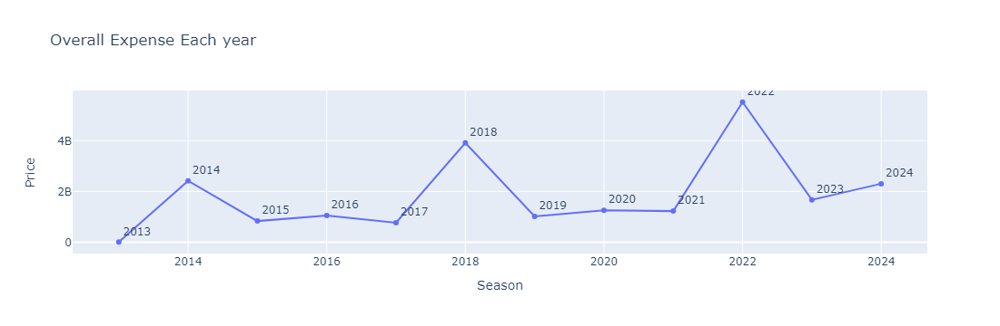

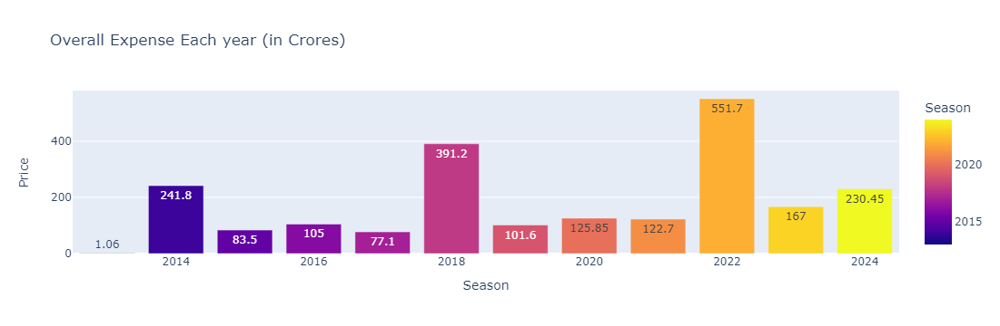

In [113]:
###The code calculates seasonal expenses, plots them as a line chart (millions) and a bar chart (crores), with labels.
data = df1.groupby('Season')['Price'].sum()
fig = px.line(data, x = data.index, y = 'Price', title = "Overall Expense Each year", text=data.index)
fig.update_traces(textposition="top right")
fig.show()
#print(data.head())
#data['Amount'] = data['Amount'].div(10000000).round(0)
data = data.div(10000000)
fig = px.bar(data, x = data.index, y = 'Price', title = "Overall Expense Each year (in Crores)",
             text= 'Price',color=data.index)
fig.show()

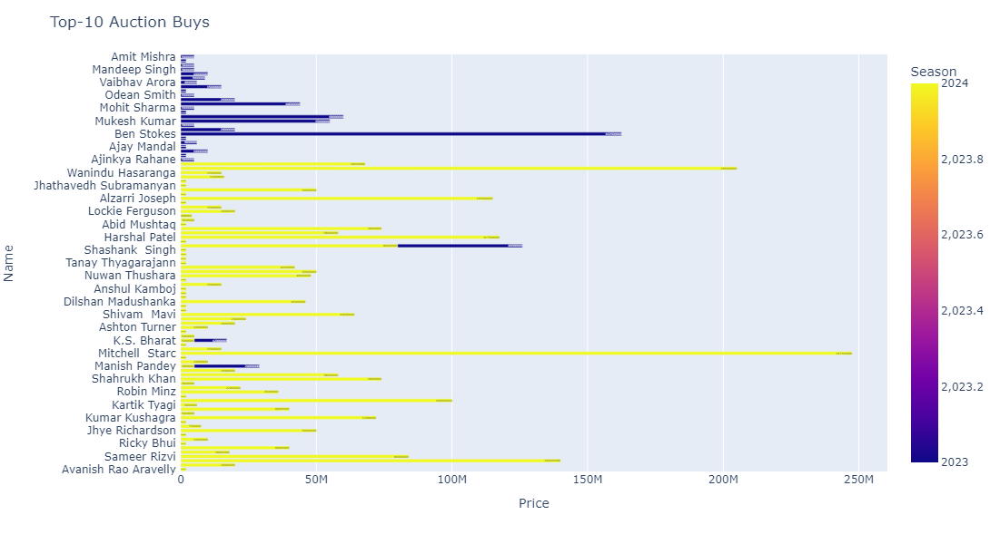

In [114]:
####The code creates a horizontal bar chart showing the top 100 auctions by price, colored by season, with price displayed as text on bars.
fig =px.bar(df1.head(100), y="Name", x="Price", color='Season',orientation='h',text='Price', height=600)
fig.update_layout(title_text = "Top-10 Auction Buys")
fig.show()

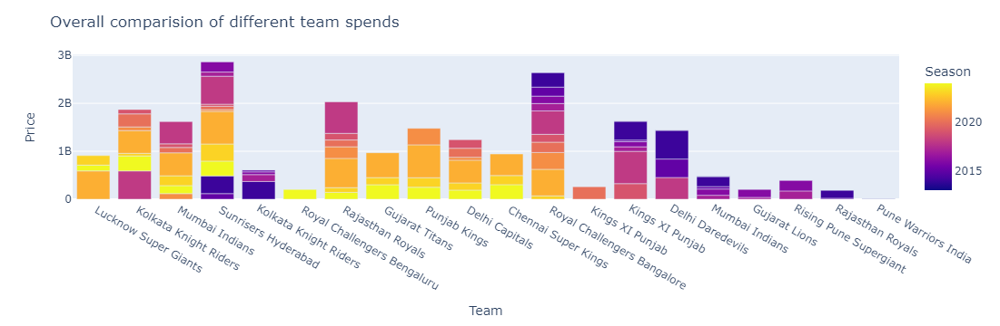

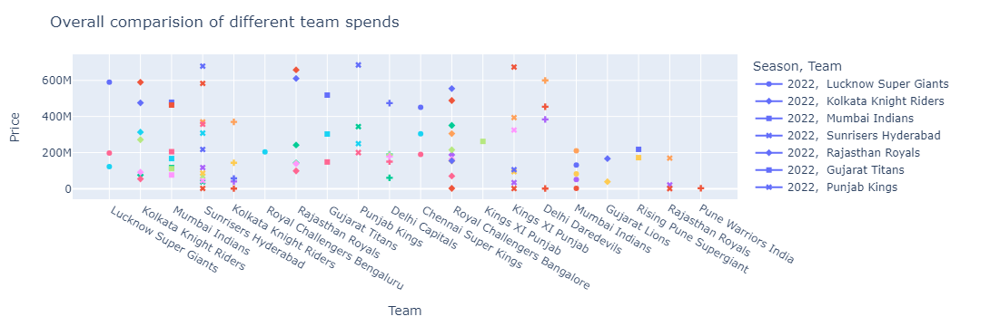

In [115]:
###The code calculates total spending per team/season in a DataFrame, then creates two visualizations: a bar chart showing total spend per team and
##a line chart showing season-wise spend per team.
data = pd.DataFrame(df1.groupby(['Team', 'Season'])['Price'].sum()).reset_index()
#data = data.sort_values(by='Amount', ascending=False)
#fig = px.line(data, x='Year', y='Amount', color='Team', symbol='Team')

data =data.sort_values(by='Price', ascending=False,
               key=lambda x: data['Season'].groupby(x).transform('sum'))
#print(data.head())
fig = px.bar(data, x='Team', y='Price', color='Season')#, symbol='Team')
fig.update_layout(title_text = "Overall comparision of different team spends")
fig.show()
fig = px.line(data, x='Team', y='Price', color='Season', symbol='Team')
#fig = px.bar(data, x='Year', y='Amount', color='Team')#, symbol='Team')
fig.update_layout(title_text = "Overall comparision of different team spends")
fig.show()

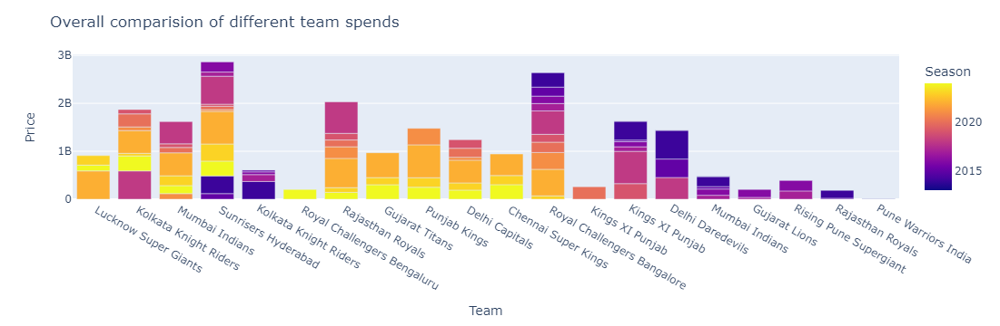

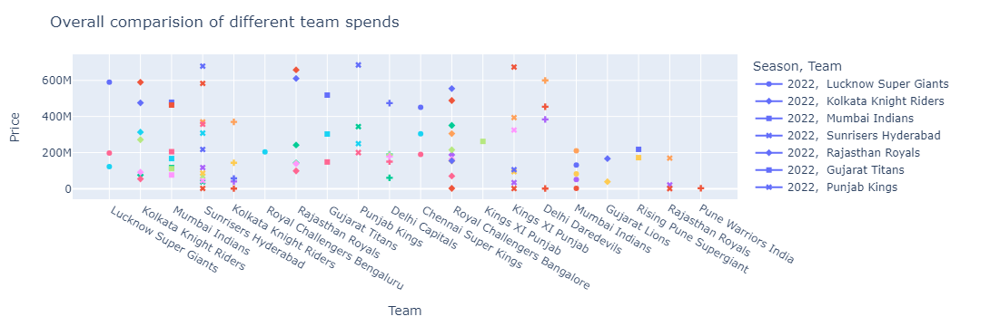

In [116]:
###The code analyzes team spending across seasons, creates two visualizations: a bar chart and a line chart. 
##It prioritizes teams with higher total spending and considers seasonal variations.
data = pd.DataFrame(df1.groupby(['Team', 'Season'])['Price'].sum()).reset_index()
#data = data.sort_values(by='Amount', ascending=False)
#fig = px.line(data, x='Year', y='Amount', color='Team', symbol='Team')

data =data.sort_values(by='Price', ascending=False,
               key=lambda x: data['Season'].groupby(x).transform('sum'))
#print(data.head())
fig = px.bar(data, x='Team', y='Price', color='Season')#, symbol='Team')
fig.update_layout(title_text = "Overall comparision of different team spends")
fig.show()
fig = px.line(data, x='Team', y='Price', color='Season', symbol='Team')
#fig = px.bar(data, x='Year', y='Amount', color='Team')#, symbol='Team')
fig.update_layout(title_text = "Overall comparision of different team spends")
fig.show()

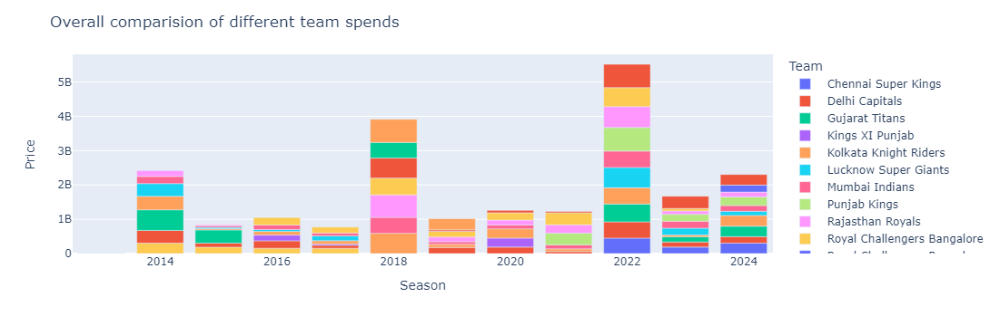

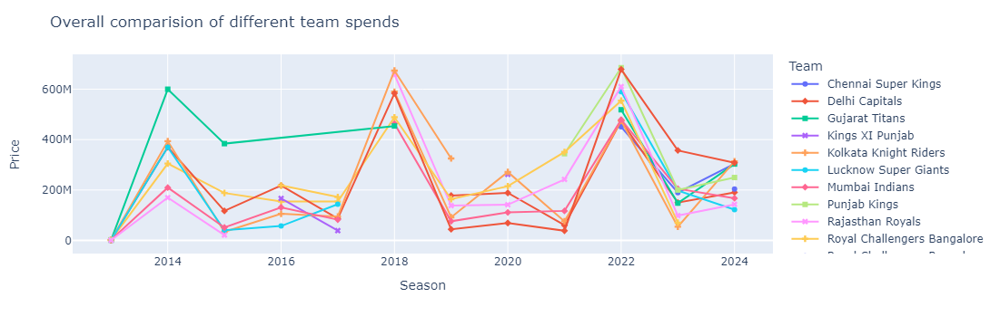

In [117]:
####The code creates two visualizations (bar and line charts) comparing total spending by 'Team' and 'Season' in a DataFrame.
##It then displays both charts.
data = pd.DataFrame(df1.groupby(['Team', 'Season'])['Price'].sum()).reset_index()
#fig = px.line(data, x='Year', y='Amount', color='Team', symbol='Team')
fig = px.bar(data, x='Season', y='Price', color='Team')#, symbol='Team')
fig.update_layout(title_text = "Overall comparision of different team spends")
fig.show()
fig = px.line(data, x='Season', y='Price', color='Team', symbol='Team')
#fig = px.bar(data, x='Year', y='Amount', color='Team')#, symbol='Team')
fig.update_layout(title_text = "Overall comparision of different team spends")
fig.show()

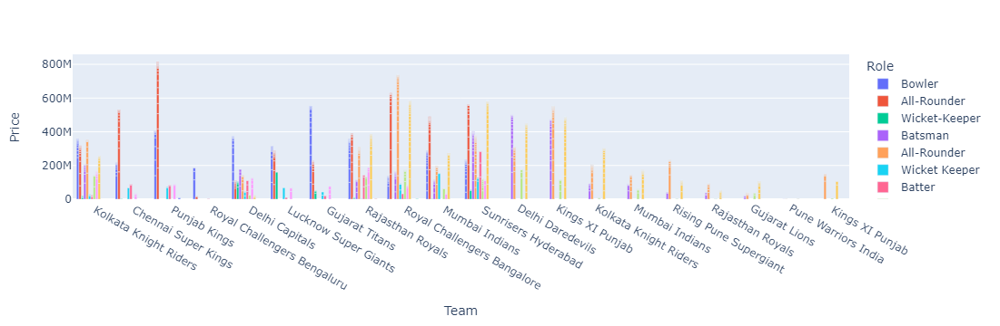

In [119]:
###The code creates a bar chart showing average "Price" for each "Team" grouped by "Role" in DataFrame df1, sorted by highest "Price" first. 
import plotly.express as px
sort_vals = df1.sort_values(by='Price',ascending=False) #.head(50)
fig = px.bar(sort_vals, x="Team", y="Price", 
             color="Role", barmode = 'group')
  
fig.show()

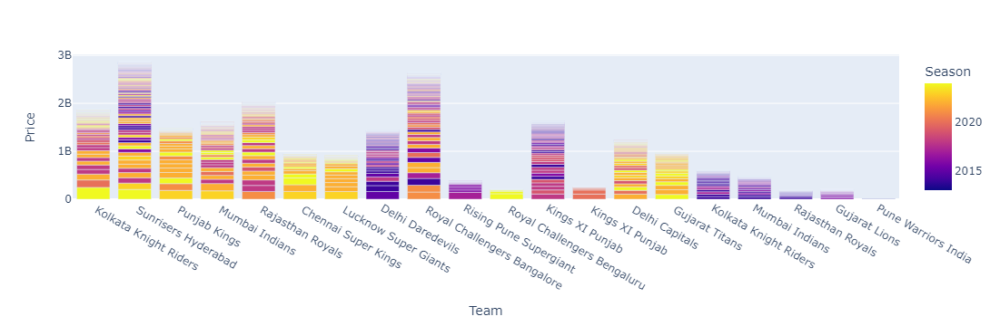

In [120]:
###This code creates a grouped bar chart using Plotly Express. It displays teams' prices across different seasons, with bars grouped by season.
fig = px.bar(sort_vals, x="Team", y="Price", 
             color="Season", barmode = 'group')
  
fig.show()

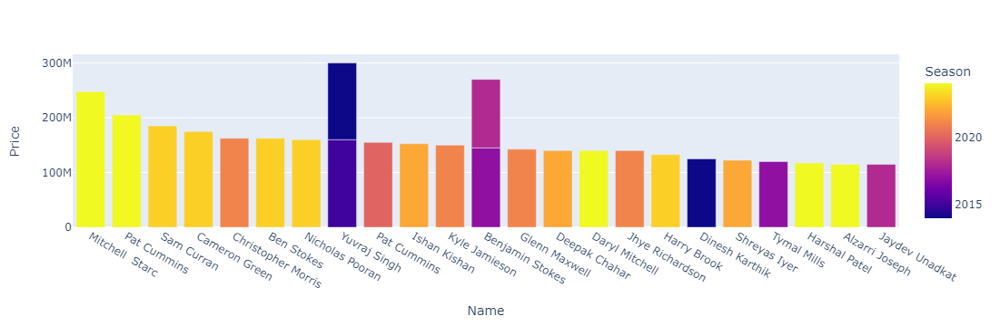

In [121]:
###This code groups data by name of players, selects top 25 entries, and creates a grouped bar chart showing prices across seasons for those entries.
group_vals = sort_vals.groupby('Name').head(25)
#print(group_vals.head())
fig = px.bar(group_vals.head(25), x="Name", y="Price", 
             color="Season", barmode = 'group') #, Title = 'Top 25 Auction Amount Paid')
  
fig.show()

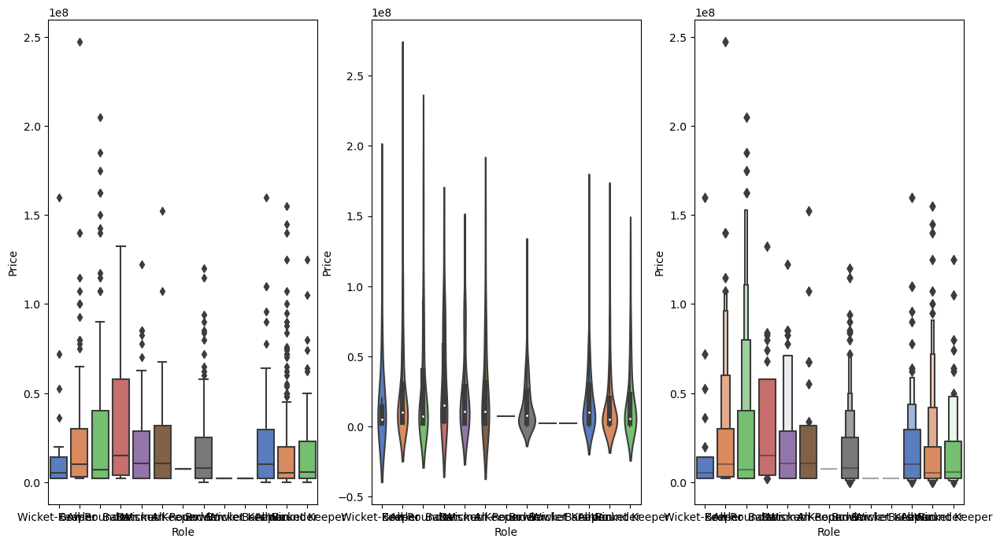

In [122]:
###This code creates three subplots using Seaborn: a boxplot, violinplot, and boxenplot, all showing price distribution by role from df1 dataset.
import seaborn as sns
fig, ax = plt.subplots(nrows=1, ncols=3,figsize=(15, 8))
sns.boxplot(x='Role', y='Price', data=df1, palette="muted", ax =ax[0])
sns.violinplot(x='Role', y='Price', data=df1, palette="muted", ax =ax[1])
sns.boxenplot(x='Role', y='Price', data=df1, palette="muted", ax =ax[2])
#ax.set_ylim([0, 0.4e8])
plt.show()

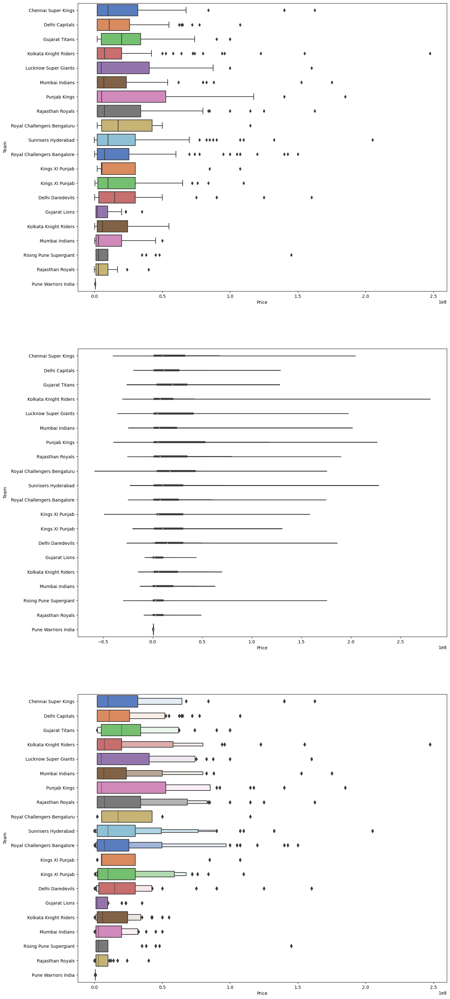

In [123]:
###This code creates three subplots using Seaborn by axis change: a boxplot, violinplot, and boxenplot, all showing price distribution by role 
##from df1 dataset.
import seaborn as sns
fig, ax = plt.subplots(nrows=3, ncols=1,figsize=(15, 40))
sns.boxplot(y='Team', x='Price', data=df1, palette="muted", ax =ax[0])
sns.violinplot(y='Team', x='Price', data=df1, palette="muted", ax =ax[1])
sns.boxenplot(y='Team', x='Price', data=df1, palette="muted", ax =ax[2])
#ax.set_ylim([0, 0.4e8])
plt.show()

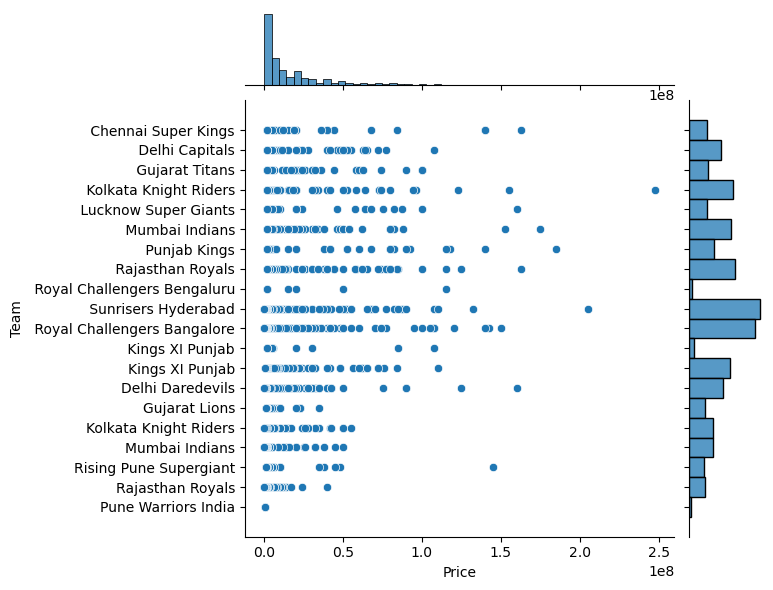

In [124]:
###This code creates a joint plot using Seaborn, showing the relationship between Team and Price in df1, with marginal distributions.
sns.jointplot(y='Team', x='Price', data=df1)
plt.show()

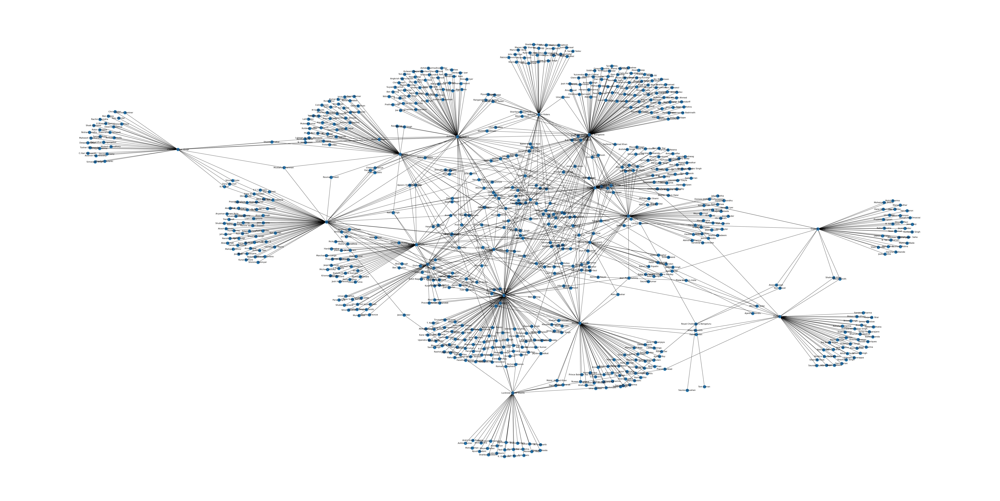

In [125]:
####This code creates a network graph using NetworkX, connecting Teams and Names from df1, then visualizes it with labels.
edges = list(zip(df1['Team'], df1['Name']))


import networkx as nx
G = nx.Graph()
G.add_edges_from(edges)

plt.figure(figsize=(80, 40))
nx.draw(G, with_labels=True)